# Artificial Vision and Deep Learning
# Module: AINT 515 and AINT 515Z
# Section: One (1)

**Setup the Environment**

Pip install ultralytics and dependencies and check software and hardware

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.5 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.8/107.7 GB disk)


Download the data

In [ ]:
!wget https://raw.githubusercontent.com/eskayML/Droplet-AINT-555-depencies/main/best.pt
!wget https://raw.githubusercontent.com/eskayML/Droplet-AINT-555-depencies/main/Droplet%20Detection.v5i.yolov8.zip
!wget https://raw.githubusercontent.com/eskayML/Droplet-AINT-555-depencies/main/requirements.txt

--2024-04-30 15:09:11--  https://raw.githubusercontent.com/eskayML/Droplet-AINT-555-depencies/main/best.pt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22475353 (21M) [application/octet-stream]
Saving to: ‘best.pt’

best.pt             100%[===================>]  21.43M  --.-KB/s    in 0.1s    

2024-04-30 15:09:12 (183 MB/s) - ‘best.pt’ saved [22475353/22475353]

--2024-04-30 15:09:12--  https://raw.githubusercontent.com/eskayML/Droplet-AINT-555-depencies/main/Droplet%20Detection.v5i.yolov8.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response...

In [ ]:
#@title Select YOLOv8 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1100), started 0:00:51 ago. (Use '!kill 1100' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!unzip "Droplet Detection.v5i.yolov8.zip"

Archive:  Droplet Detection.v5i.yolov8.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: train/
   creating: train/images/
 extracting: train/images/frame_150_jpg.rf.fb45de525d4309e796a986d945d00ea1.jpg  
 extracting: train/images/frame_315_jpg.rf.8f44cc12c3992d958e7b93d0efc05b68.jpg  
 extracting: train/images/frame_390_jpg.rf.fd8c604c37f1b88874238215d58d7318.jpg  
 extracting: train/images/frame_420_jpg.rf.fe5bee2ff55a3c10c286214911be2010.jpg  
 extracting: train/images/frame_435_jpg.rf.9c51ff20adca05e3904ca5d48f1c00a2.jpg  
 extracting: train/images/frame_450_jpg.rf.2fb1151294eb9d4e7f97c8a4244c7743.jpg  
 extracting: train/images/frame_45_jpg.rf.8eb5c756ede4d7a0cd0474e40d260e21.jpg  
 extracting: train/images/frame_480_jpg.rf.4e440493aeae5b25fe78a92da9218e0d.jpg  
 extracting: train/images/frame_510_jpg.rf.460cc3435f318182168e54ab23eb35b3.jpg  
 extracting: train/images/frame_60_jpg.rf.fa7a95597062e057d484d9fa52f9c420.jpg  
 extracting: tra

In [ ]:
%%writefile data.yaml

train: /content/train/images
val: /content/train/images

nc: 2
names: ['Inner droplet', 'Outer wrap']

Overwriting data.yaml


In [ ]:
# Train YOLOv8n on COCO8 for 3 epochs
!yolo train model=yolov8s.pt data=data.yaml epochs=50 imgsz=640

100% 21.5M/21.5M [00:00<00:00, 212MB/s]
Ultralytics YOLOv8.2.5 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh


0: 128x640 8 Inner droplets, 5 Outer wraps, 171.0ms
1: 128x640 7 Inner droplets, 4 Outer wraps, 171.0ms
Speed: 2.4ms preprocess, 171.0ms inference, 1380.7ms postprocess per image at shape (1, 3, 128, 640)


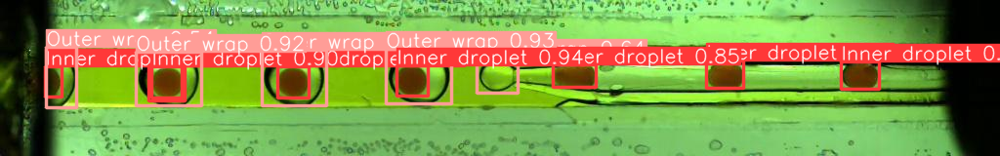

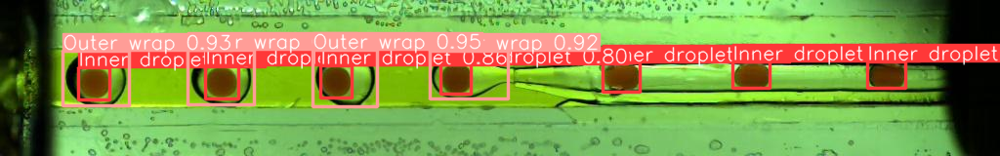

In [ ]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from PIL import Image

MODEL_PATH = '/content/best.pt'

model = YOLO(MODEL_PATH)
results = model(["/content/train/images/frame_150_jpg.rf.fb45de525d4309e796a986d945d00ea1.jpg",
                '/content/train/images/frame_315_jpg.rf.8f44cc12c3992d958e7b93d0efc05b68.jpg'])



for i, r in enumerate(results):
    # Plot results image
    im_bgr = r.plot()  # BGR-order numpy array
    cv2_imshow(im_bgr)

In [ ]:
import cv2 as cv   #opencv itself (under the name cv)
import numpy as np #numpy math library (under the name np)
import math

#image displaying libraries
import pylab
from matplotlib import pyplot as plt
from IPython.display import HTML
from IPython.display import clear_output
from base64 import b64encode
import torch

#make generated images appear inline below the code
%matplotlib inline

#set the displayed image size
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

# Download example videos
!wget https://raw.githubusercontent.com/Jamesrogers221194/AINT-Files/3f989bb044250abdc3c25ccc5d4c10744e649369/AINT515/Coursework01/Video1%20for%20Vision%20CW.mp4
!wget https://raw.githubusercontent.com/Jamesrogers221194/AINT-Files/3f989bb044250abdc3c25ccc5d4c10744e649369/AINT515/Coursework01/Video2%20for%20Vision%20CW.mp4

--2024-04-30 15:44:15--  https://raw.githubusercontent.com/Jamesrogers221194/AINT-Files/3f989bb044250abdc3c25ccc5d4c10744e649369/AINT515/Coursework01/Video1%20for%20Vision%20CW.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 786074 (768K) [application/octet-stream]
Saving to: ‘Video1 for Vision CW.mp4’

Video1 for Vision C 100%[===================>] 767.65K  --.-KB/s    in 0.03s   

2024-04-30 15:44:16 (21.6 MB/s) - ‘Video1 for Vision CW.mp4’ saved [786074/786074]

--2024-04-30 15:44:16--  https://raw.githubusercontent.com/Jamesrogers221194/AINT-Files/3f989bb044250abdc3c25ccc5d4c10744e649369/AINT515/Coursework01/Video2%20for%20Vision%20CW.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.

**Experimental Inferences**
1. Detecting Outer Wrap & Inner Droplet

In [ ]:
videoInput = cv.VideoCapture('Video1 for Vision CW.mp4')
#videoInput = cv.VideoCapture('Video2 for Vision CW.mp4') #uncomment to load the second video
if (videoInput.isOpened() == False):
  print("Error opening video stream or file")

#Setup output video writer
videoOutput = cv.VideoWriter('output.avi',cv.VideoWriter_fourcc(*'MJPG'), 30, (int(videoInput.get(cv.CAP_PROP_FRAME_WIDTH)),int(videoInput.get(cv.CAP_PROP_FRAME_HEIGHT))))

#==================================Main Program Loop================================
while(1):
  #grab a frame, break the loop if there are no frames left
  ret, frame = videoInput.read()
  if(ret == False):
    break;
  results = model(frame)

  annotated_frame = results[0].plot(line_width = 1, font_size = 2)
  videoOutput.write(annotated_frame)

  if cv.waitKey(1) & 0xFF == ord("q"):
    break


videoOutput.release()
print("Loading Video...")
!ffmpeg -i output.avi output.mp4 -hide_banner -loglevel error -y
clear_output()
HTML(f"""<video width=1300 controls autoplay loop><source src="{"data:video/mp4;base64," + b64encode(open('output.mp4', "rb").read()).decode()}" type="video/mp4"></video>""")

##2. Object Counting: for formed droplets

In [ ]:
from ultralytics.solutions import object_counter
import cv2 as cv  # Assuming cv2 is imported as cv
from IPython.display import HTML, clear_output
from base64 import b64encode

videoInput = cv.VideoCapture('Video1 for Vision CW.mp4')
counter = object_counter.ObjectCounter()
counter.set_args(reg_pts=[(70, 0), (70, 640)],  # Define your line or region points
                 classes_names=model.names,  # Assuming model.names is defined elsewhere
                 draw_tracks=False, line_thickness=1, view_out_counts=True)

if not videoInput.isOpened():
    print("Error opening video stream or file")

videoOutput = cv.VideoWriter('output.avi', cv.VideoWriter_fourcc(*'MJPG'), 30,
                             (int(videoInput.get(cv.CAP_PROP_FRAME_WIDTH)),
                              int(videoInput.get(cv.CAP_PROP_FRAME_HEIGHT))))

# Main Program Loop
while True:
    ret, im0 = videoInput.read()
    if not ret:
        break

    tracks = model.track(im0, persist=True, show=False, classes=[1])

    # Check if tracks is None or empty, skip this frame if so
    if tracks is None or not tracks:
        print("Warning: No tracks found or 'tracks' is None. Skipping this frame.")
        continue

    try:
        im0 = counter.start_counting(im0, tracks)
        videoOutput.write(im0)
    except TypeError as e:
        print(f"Error processing frame: {e}")
        continue

    if cv.waitKey(1) & 0xFF == ord("q"):
        break

videoOutput.release()
print("Video processing complete. Converting to MP4...")

# Assuming ffmpeg command and clear_output() usage is part of a Jupyter Notebook or similar environment
!ffmpeg -i output.avi output.mp4 -hide_banner -loglevel error -y
clear_output()
print("Displaying Video...")
HTML(f"""<video width=1300 controls autoplay loop><source src="{"data:video/mp4;base64," + b64encode(open('output.mp4', "rb").read()).decode()}" type="video/mp4"></video>""")

Displaying Video...


3. Center of Mass Detection

In [ ]:
model= YOLO(MODEL_PATH)
videoInput = cv.VideoCapture('Video1 for Vision CW.mp4')
#videoInput = cv.VideoCapture('Video2 for Vision CW.mp4') #uncomment to load the second video
if (videoInput.isOpened() == False):
  print("Error opening video stream or file")

#Setup output video writer
videoOutput = cv.VideoWriter('output.avi',cv.VideoWriter_fourcc(*'MJPG'), 30, (int(videoInput.get(cv.CAP_PROP_FRAME_WIDTH)),int(videoInput.get(cv.CAP_PROP_FRAME_HEIGHT))))

#==================================Main Program Loop================================
while True:
  #grab a frame, break the loop if there are no frames left
  ret, frame = videoInput.read()
  if ret:
    results = model(frame)
    annotated_frame = results[0].plot(line_width=1, font_size=2)

    # Iterate through detections and draw center markers
    for box in results[0].boxes.data:
      #print(box.tolist())
      x1, y1, x2, y2, conf, class_id = box.tolist()

      if int(class_id) == 0:
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        cv.drawMarker(annotated_frame, (center_x, center_y),(0,0,0), cv.MARKER_STAR, 5, 3)
      # cv.drawMarker(annotated_frame, (center_x, center_y),(0,0,0), cv.MARKER_STAR, 5, 3)
    videoOutput.write(annotated_frame)
  else:
    break

  if cv.waitKey(1) & 0xFF == ord("q"):
    break



videoOutput.release()

print("Loading Video...")
!ffmpeg -i output.avi output.mp4 -hide_banner -loglevel error -y
clear_output()
HTML(f"""<video width=1300 controls autoplay loop><source src="{"data:video/mp4;base64," + b64encode(open('output.mp4', "rb").read()).decode()}" type="video/mp4"></video>""")